### Submitted by: Naailah Mahamoodally (40269839)
Explainable Occupancy Detection Using PCA

In [535]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/My Drive/INSE 6220 Project'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/INSE 6220 Project


## Install Libraries

In [536]:
!pip install pycaret

In [537]:
!pip install shap

## Import Libraries

In [538]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.decomposition import PCA
np.random.seed(8)
from sklearn import feature_selection

In [539]:
print("Pandas version: ", pd.__version__)
print("Numpy version: ", np.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  2.0.3
Numpy version:  1.25.2
Seaborn version:  0.13.1


## Import Dataset

In [540]:
df= pd.read_csv("Occupancy_Estimation.csv")

In [541]:
df.head(10)

,Time,co2,Temperature_1,Temperature_2,Temperature_3,Door_Contact,Motion,Humidity_1,Humidity_2,Humidity_3,COV,Mean_Power,Presence
0,0,390,17.2,18.08,17.28,0,1,30,34.4,38.0,24,8.25,0
1,600,390,17.2,18.08,17.28,0,0,30,34.4,38.0,25,8.25,0
2,1200,390,17.4,18.24,17.12,0,0,30,34.0,38.0,25,8.25,0
3,1800,390,17.4,18.24,17.12,0,0,30,34.0,38.0,25,8.25,0
4,2400,390,17.6,18.40,17.12,0,0,30,34.0,38.0,25,8.25,0
5,3000,390,17.6,18.40,17.12,0,1,30,34.0,38.0,25,8.25,0
6,3600,390,17.6,18.40,17.28,0,1,30,34.0,38.4,25,8.25,0
7,4200,390,17.6,18.56,17.12,0,1,30,33.6,38.8,25,8.25,0
8,4800,390,17.6,18.56,17.12,0,1,30,33.6,38.8,25,8.25,0
9,5400,390,17.8,18.72,17.12,0,1,30,33.6,38.8,25,8.25,0


In [542]:
y = df['Presence']
X = df.drop(['Time', 'Presence'], axis= 1)

## Data Exploration

In [543]:
df.shape

(1068, 13)

In [544]:
len(df.index)

1068

In [545]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1068 entries, 0 to 1067
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Time           1068 non-null   int64  
 1   co2            1068 non-null   int64  
 2   Temperature_1  1068 non-null   float64
 3   Temperature_2  1068 non-null   float64
 4   Temperature_3  1068 non-null   float64
 5   Door_Contact   1068 non-null   int64  
 6   Motion         1068 non-null   int64  
 7   Humidity_1     1068 non-null   int64  
 8   Humidity_2     1068 non-null   float64
 9   Humidity_3     1068 non-null   float64
 10  COV            1068 non-null   int64  
 11  Mean_Power     1068 non-null   float64
 12  Presence       1068 non-null   int64  
dtypes: float64(6), int64(7)
memory usage: 108.6 KB


In [546]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [547]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


Class 0: 772 instances
Class 1: 192 instances
Class 2: 104 instances


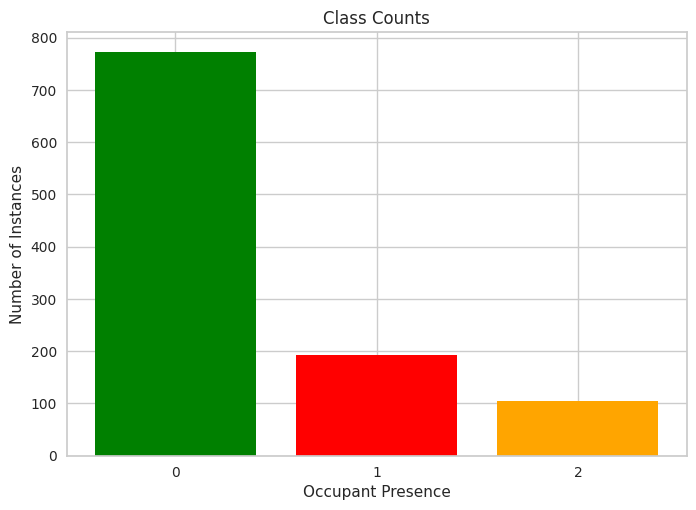

In [548]:
unique_classes, class_counts = np.unique(y, return_counts=True)
colors = ['green', 'red', 'orange']
# Print the results
for class_label, count in zip(unique_classes, class_counts):
    print(f"Class {class_label}: {count} instances")
plt.bar(unique_classes, class_counts, color=colors)
plt.xlabel('Occupant Presence')
plt.ylabel('Number of Instances')
plt.title('Class Counts')
plt.xticks(unique_classes.astype(int))
plt.show()

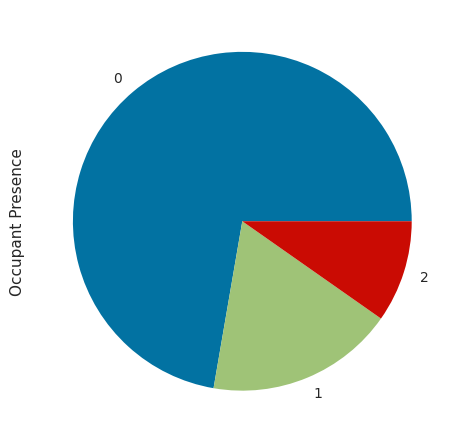

In [549]:
y.value_counts().plot(kind='pie')
plt.ylabel('Occupant Presence')
plt.show()

In [550]:
#Create new dataframe without the Time Feature
df1= pd.concat([X, y], axis=1)
df1.head(10)

,co2,Temperature_1,Temperature_2,Temperature_3,Door_Contact,Motion,Humidity_1,Humidity_2,Humidity_3,COV,Mean_Power,Presence
0,390,17.2,18.08,17.28,0,1,30,34.4,38.0,24,8.25,0
1,390,17.2,18.08,17.28,0,0,30,34.4,38.0,25,8.25,0
2,390,17.4,18.24,17.12,0,0,30,34.0,38.0,25,8.25,0
3,390,17.4,18.24,17.12,0,0,30,34.0,38.0,25,8.25,0
4,390,17.6,18.40,17.12,0,0,30,34.0,38.0,25,8.25,0
5,390,17.6,18.40,17.12,0,1,30,34.0,38.0,25,8.25,0
6,390,17.6,18.40,17.28,0,1,30,34.0,38.4,25,8.25,0
7,390,17.6,18.56,17.12,0,1,30,33.6,38.8,25,8.25,0
8,390,17.6,18.56,17.12,0,1,30,33.6,38.8,25,8.25,0
9,390,17.8,18.72,17.12,0,1,30,33.6,38.8,25,8.25,0


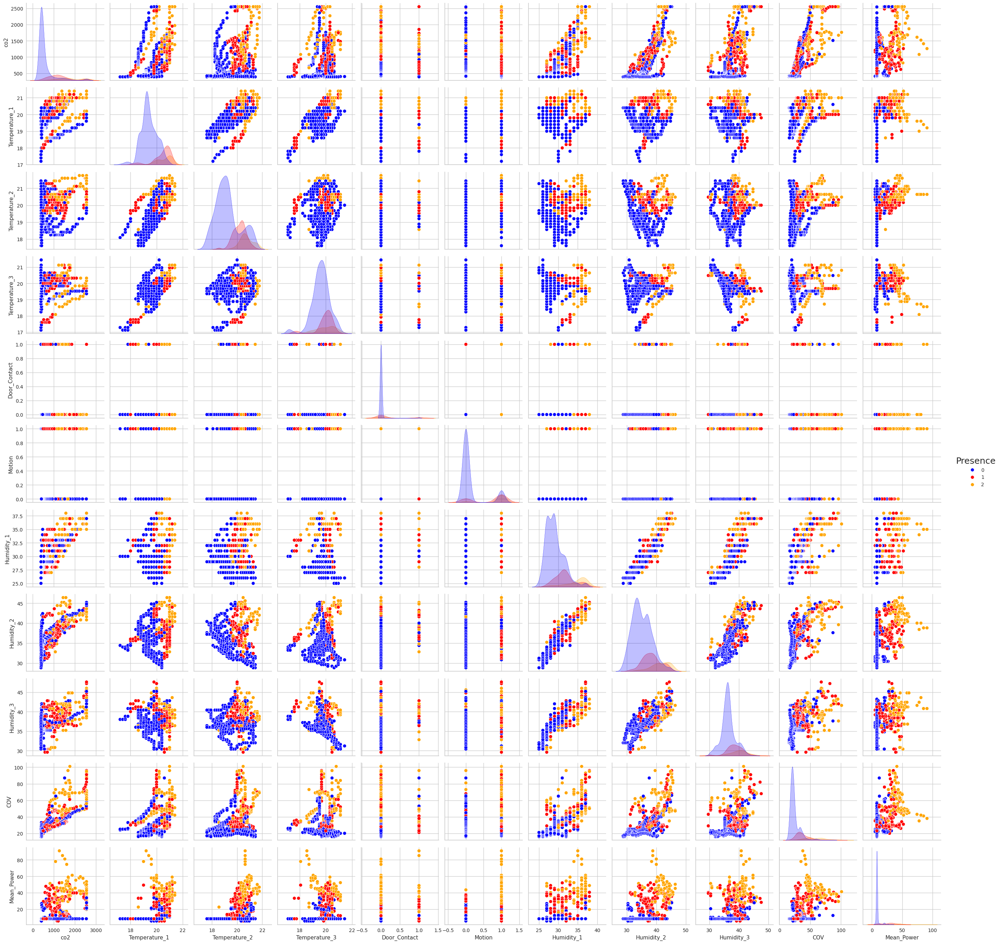

In [551]:
#Pairplot Diagram
custom_palette = {0: 'blue', 1: 'red', 2:'orange'}
sns.pairplot(df1, hue='Presence', palette=custom_palette)
plt.show()

In [552]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
co2,1068.0,815.065543,608.208683,390.00,390.00,470.00,1100.00,2550.00
Temperature_1,1068.0,19.710300,0.798925,17.20,19.20,19.60,20.40,21.40
Temperature_2,1068.0,19.550861,1.011054,17.60,18.72,19.36,20.48,21.76
Temperature_3,1068.0,19.711910,0.704365,17.12,19.36,19.84,20.16,21.44
Door_Contact,1068.0,0.050562,0.219204,0.00,0.00,0.00,0.00,1.00
Motion,1068.0,0.308052,0.461905,0.00,0.00,0.00,1.00,1.00
Humidity_1,1068.0,30.056180,2.984281,25.00,28.00,29.00,32.00,38.00
Humidity_2,1068.0,36.283146,3.841369,28.80,33.20,36.00,38.80,46.40
Humidity_3,1068.0,37.092135,2.834897,29.60,35.20,36.40,38.80,47.60
COV,1068.0,30.357678,14.895744,16.00,21.00,24.00,35.00,101.00


In [553]:
#observations and variables
observations = list(df.index)
variables = list(df.columns)

### Standardization

In [554]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(X)

In [555]:
Xcols = X.columns
data_scaled = pd.DataFrame(data_scaled)
data_scaled.columns = Xcols
data_scaled.head(10)

,co2,Temperature_1,Temperature_2,Temperature_3,Door_Contact,Motion,Humidity_1,Humidity_2,Humidity_3,COV,Mean_Power
0,-0.699209,-3.143567,-1.455461,-3.454247,-0.230769,1.498733,-0.018834,-0.490458,0.320396,-0.427012,-0.544184
1,-0.699209,-3.143567,-1.455461,-3.454247,-0.230769,-0.667230,-0.018834,-0.490458,0.320396,-0.359847,-0.544184
2,-0.699209,-2.893114,-1.297137,-3.681509,-0.230769,-0.667230,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
3,-0.699209,-2.893114,-1.297137,-3.681509,-0.230769,-0.667230,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
4,-0.699209,-2.642660,-1.138812,-3.681509,-0.230769,-0.667230,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
5,-0.699209,-2.642660,-1.138812,-3.681509,-0.230769,1.498733,-0.018834,-0.594636,0.320396,-0.359847,-0.544184
6,-0.699209,-2.642660,-1.138812,-3.454247,-0.230769,1.498733,-0.018834,-0.594636,0.461561,-0.359847,-0.544184
7,-0.699209,-2.642660,-0.980487,-3.681509,-0.230769,1.498733,-0.018834,-0.698814,0.602726,-0.359847,-0.544184
8,-0.699209,-2.642660,-0.980487,-3.681509,-0.230769,1.498733,-0.018834,-0.698814,0.602726,-0.359847,-0.544184
9,-0.699209,-2.392207,-0.822162,-3.681509,-0.230769,1.498733,-0.018834,-0.698814,0.602726,-0.359847,-0.544184


In [556]:
data_scaled.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
co2,1068.0,-5.322417e-17,1.000468,-0.699209,-0.699209,-0.567613,0.468701,2.853868
Temperature_1,1068.0,1.596725e-15,1.000468,-3.143567,-0.639032,-0.138125,0.863690,2.115957
Temperature_2,1068.0,1.244115e-15,1.000468,-1.930436,-0.822162,-0.188863,0.919410,2.186009
Temperature_3,1068.0,-2.661209e-16,1.000468,-3.681509,-0.499848,0.181937,0.636460,2.454552
Door_Contact,1068.0,-1.995907e-17,1.000468,-0.230769,-0.230769,-0.230769,-0.230769,4.333333
Motion,1068.0,-7.983626e-17,1.000468,-0.667230,-0.667230,-0.667230,1.498733,1.498733
Humidity_1,1068.0,-1.862846e-16,1.000468,-1.695065,-0.689326,-0.354080,0.651658,2.663135
Humidity_2,1068.0,3.991813e-16,1.000468,-1.948954,-0.802992,-0.073744,0.655504,2.634892
Humidity_3,1068.0,1.836234e-15,1.000468,-2.644063,-0.667757,-0.244263,0.602726,3.708350
COV,1068.0,-1.330604e-16,1.000468,-0.964329,-0.628506,-0.427012,0.311800,4.744672


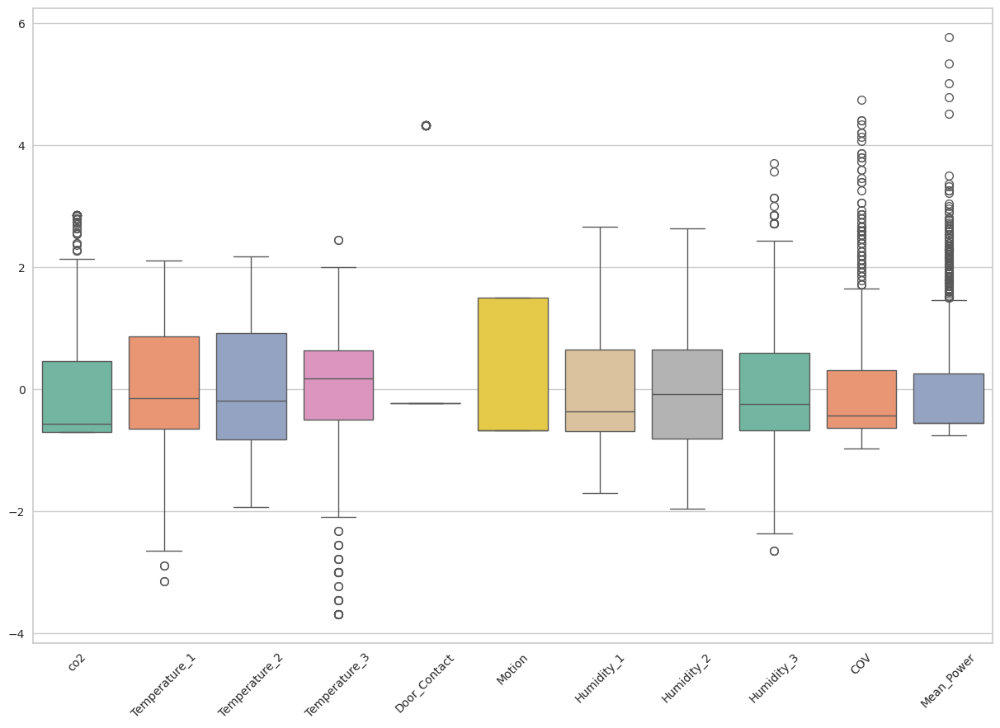

In [557]:
#visualisation of the data using a box plot
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=data_scaled, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

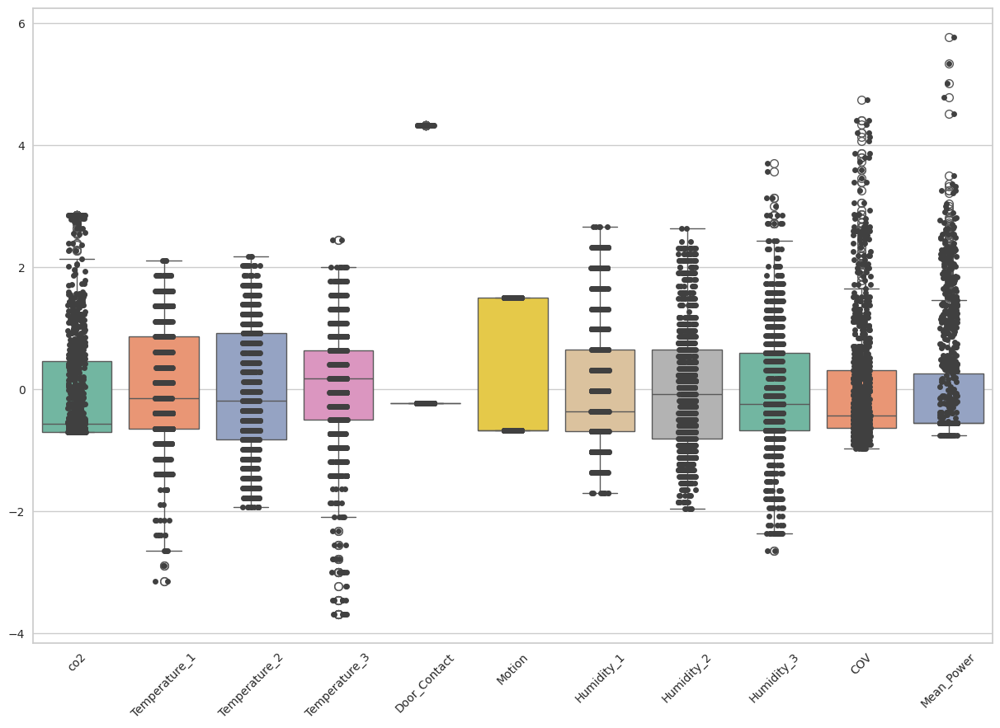

In [558]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=data_scaled, orient="v", palette="Set2")
ax = sns.stripplot(data=data_scaled, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

Text(0.5, 1.0, 'Pairplot')

<Figure size 800x550 with 0 Axes>

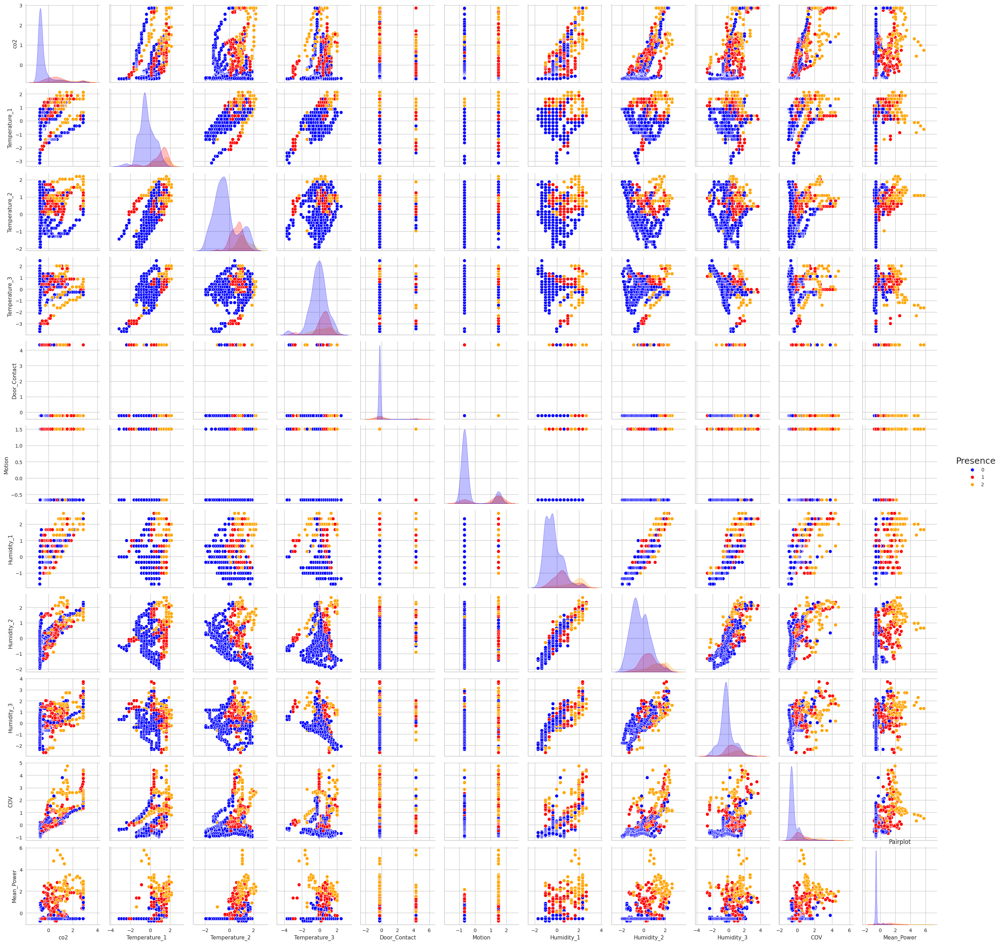

In [559]:
#pairplot
data_scaled =pd.DataFrame(data_scaled)
data_scaled2 = pd.concat([data_scaled, y], axis=1)
plt.figure()
sns.pairplot(data_scaled2, hue='Presence', palette=custom_palette)
plt.title('Pairplot')

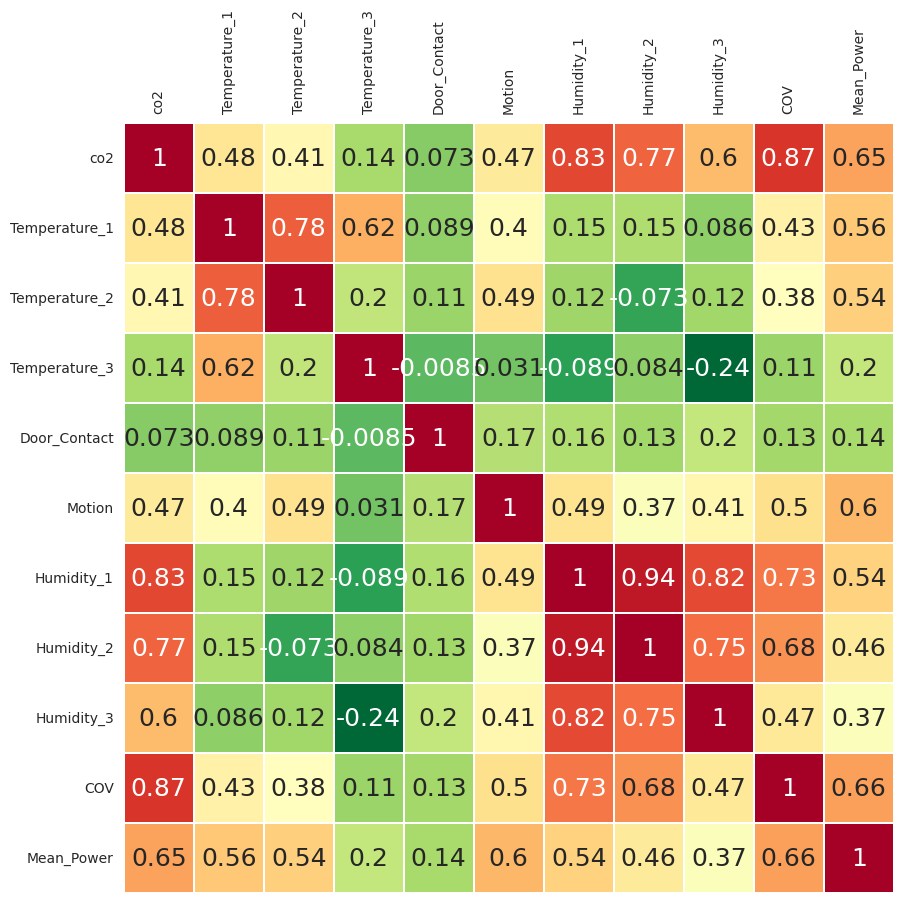

In [560]:
#Correlation Matrix
fig1,ax1 = plt.subplots(figsize=(10,10))
ax = sns.heatmap(data_scaled.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90);

Text(0.5, 1.0, 'Covariance matrix')

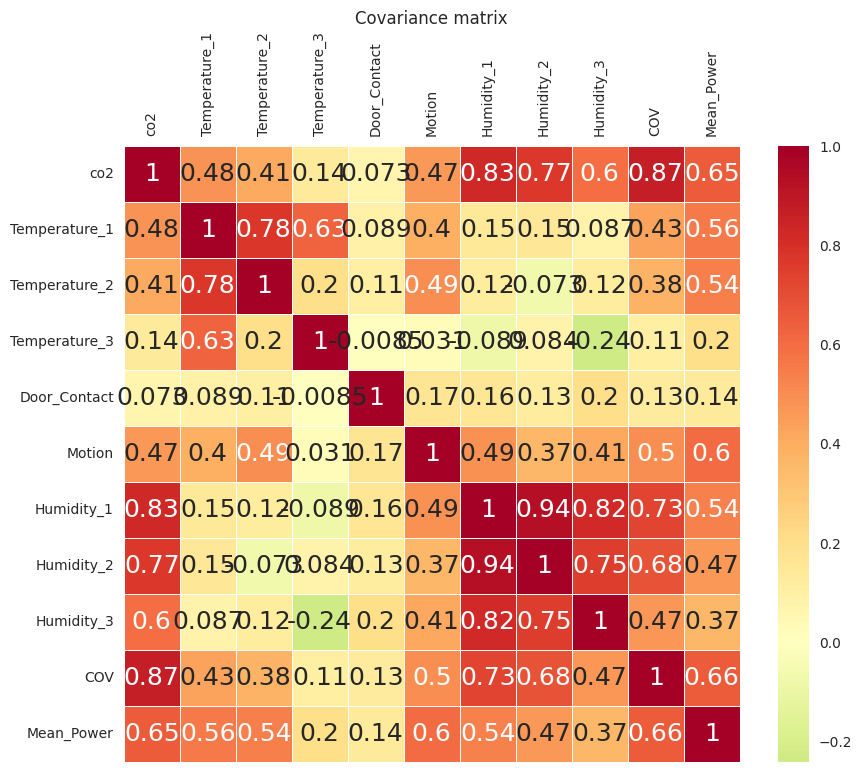

In [561]:
#Covariance Matrix
plt. figure(figsize=(10, 8))
ax = sns.heatmap(data_scaled.cov(), center=0,cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=True, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.title('Covariance matrix')

### Feature importance

In [562]:
#ANOVA using f_classif
chi2, pval = feature_selection.f_classif(X,y)
np.round(chi2)

array([ 476.,  300.,  200.,   24.,   55.,  299.,  299.,  230.,  124.,
        578., 1215.])

In [563]:
#Mutual Information for classification using mutual_info_classification
from sklearn.preprocessing import LabelEncoder
for col in X:
    le = LabelEncoder()
    X[col]  = le.fit_transform(X[col])
feature_selection.mutual_info_classif(X, y)

array([0.33703827, 0.30339416, 0.2743444 , 0.11431132, 0.03986358,
       0.17699896, 0.19939218, 0.17658039, 0.17190265, 0.34082838,
       0.45219629])

In [564]:
#SelectKBest
selector = feature_selection.SelectKBest(k=7, score_func=feature_selection.mutual_info_classif)
data = selector.fit_transform(X,y)
selector.scores_

array([0.34373035, 0.30169033, 0.26647497, 0.11438554, 0.0393371 ,
       0.1802765 , 0.21051933, 0.18389279, 0.13965257, 0.34625924,
       0.4581424 ])

### PCA

In [565]:
pca = PCA()
Z = pca.fit_transform(data_scaled)
#pcs = pd.DataFrame(pcs)
#pcs.columns = ['pc_' + str(i) for i in range(1, 1)]

Text(0, 0.5, '$Z_2$')

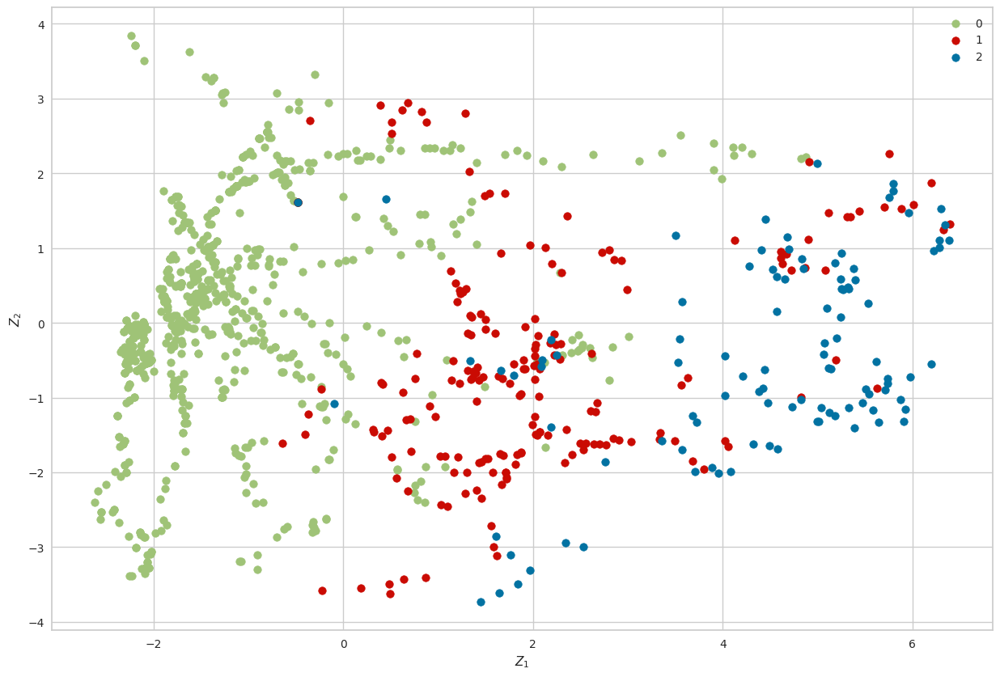

In [566]:
idx_zero= np.where(y == 0)
idx_one = np.where(y == 1)
idx_two = np.where(y == 2)

plt. figure(figsize=(15,10))
plt.scatter(Z[idx_zero,0], Z[idx_zero,1], c='g', label='0')
plt.scatter(Z[idx_one,0], Z[idx_one,1], c='r', label='1')
plt.scatter(Z[idx_two,0], Z[idx_two,1], c='b', label='2')

plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

In [567]:
eigenvectors = pca.components_
eigenvectors

array([[ 0.40199884,  0.24599605,  0.21907548,  0.07025762,  0.09290087,
         0.29841995,  0.38027143,  0.34979822,  0.30873113,  0.38062449,
         0.34657261],
       [ 0.03719998, -0.51028012, -0.45552633, -0.43222953,  0.02103459,
        -0.10176583,  0.30330296,  0.30844932,  0.33691651,  0.01109076,
        -0.17982109],
       [-0.1811961 , -0.07947061,  0.32583071, -0.51476411,  0.58279276,
         0.35606951, -0.07827305, -0.28588395,  0.1299638 , -0.10940608,
         0.08096406],
       [-0.05431225,  0.07712125, -0.26118786,  0.4593584 ,  0.7836976 ,
        -0.21870291,  0.02324398,  0.19003044, -0.00647202, -0.04221082,
        -0.10669989],
       [ 0.31744685,  0.11772032,  0.32422576, -0.31108744,  0.12148693,
        -0.73603235, -0.01439317, -0.1298014 , -0.00928983,  0.29154613,
        -0.15756895],
       [ 0.08571971, -0.30462854, -0.26040214, -0.11434346,  0.12572417,
         0.06009464, -0.07249004, -0.06065394, -0.63448854,  0.46798061,
         0.411

In [568]:
eigenvalues = pca.explained_variance_
eigenvalues

array([5.19790075, 2.21585836, 1.09465804, 0.92382545, 0.51516955,
       0.47113631, 0.30869933, 0.11549017, 0.0898426 , 0.06612914,
       0.01159958])

<Figure size 800x550 with 0 Axes>

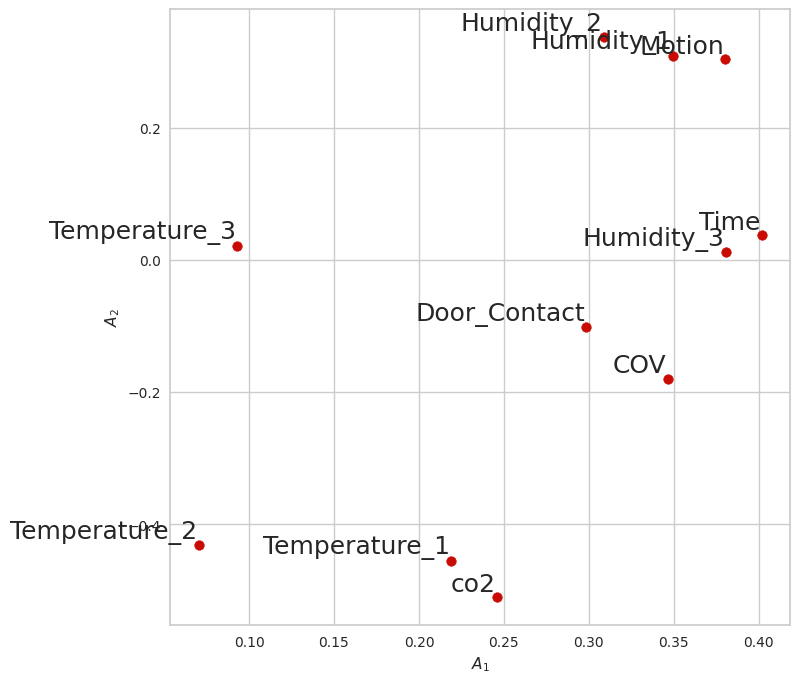

In [569]:
#Eigenvectors
A = pca.components_.T
plt. figure()
plt.figure(figsize=(8,8))
plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$');
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
    plt.annotate(label, xy=(x, y), xytext=(-1, 1),
        textcoords='offset points', ha='right', va='bottom')



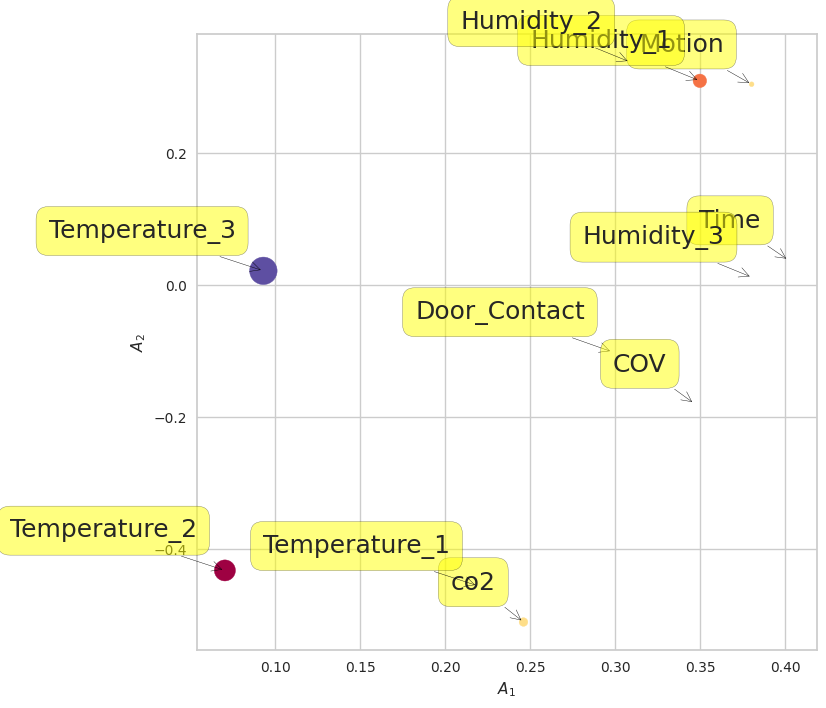

In [570]:
plt. figure(figsize=(8,8))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

### Pareto for explained variance

Text(0, 0.5, 'Cumulative explained variance')

<Figure size 800x550 with 0 Axes>

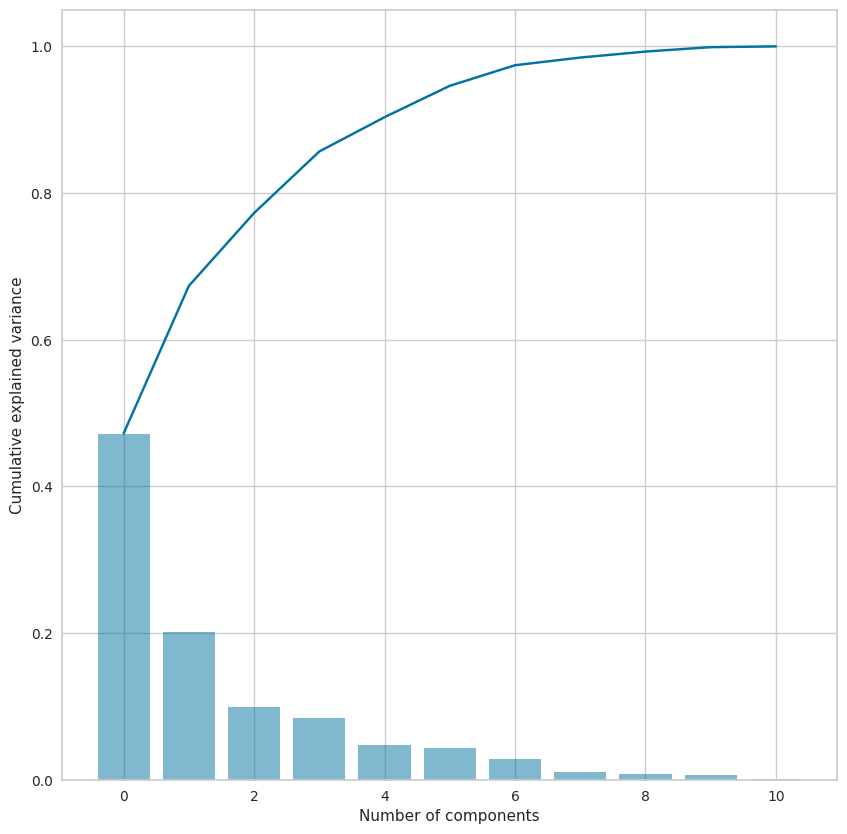

In [571]:
#Explained variance
ell = pca.explained_variance_ratio_
plt. figure()
plt.figure(figsize=(10, 10))
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

### Scree plot

0.6733470353578437

<Figure size 800x550 with 0 Axes>

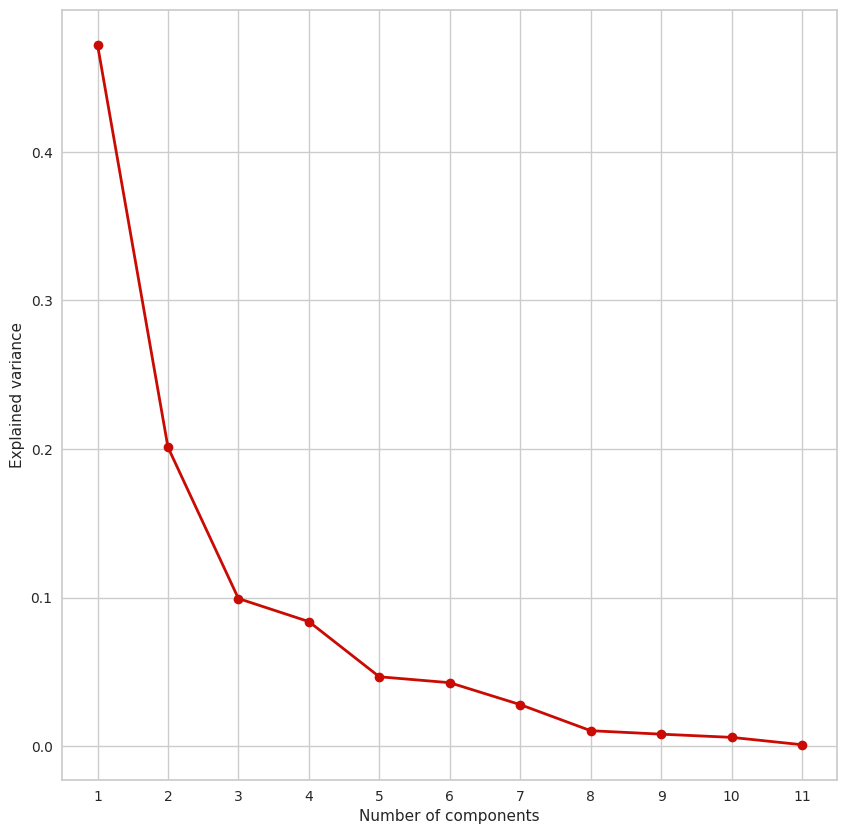

In [572]:
Lambda = pca.explained_variance_
plt. figure()
plt.figure(figsize=(10, 10))
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/Lambda.sum(), 'ro-', lw=2)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

(Lambda[1]+Lambda[0])/Lambda.sum()

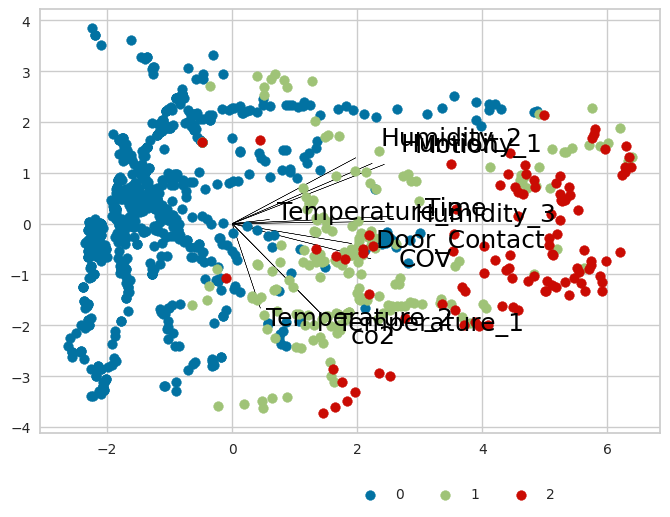

In [573]:
#Biplot
A1 = A[:,0]
A2 = A[:,1]
A3 = A[:,2]
Z1 = Z[:,0]
Z2 = Z[:,1]
Z3 = Z[:,2]

fig, ax = plt.subplots()

for i in range(len(A1)):
# arrows project features as vectors onto PC axes
    ax.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2),
              color='black', width=0.00005, head_width=0.0025)
    ax.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2, variables[i], color='black')

for i in df1['Presence'].unique():

  ax.scatter(Z1[df1['Presence']==i], Z2[df1['Presence']==i], marker='o',label=str(i))

legend = ax.legend(shadow=False, ncol=3, bbox_to_anchor=(0.85, -0.1))

plt.show()



Text(0.5, 1.0, '\n\nPrincipal components')

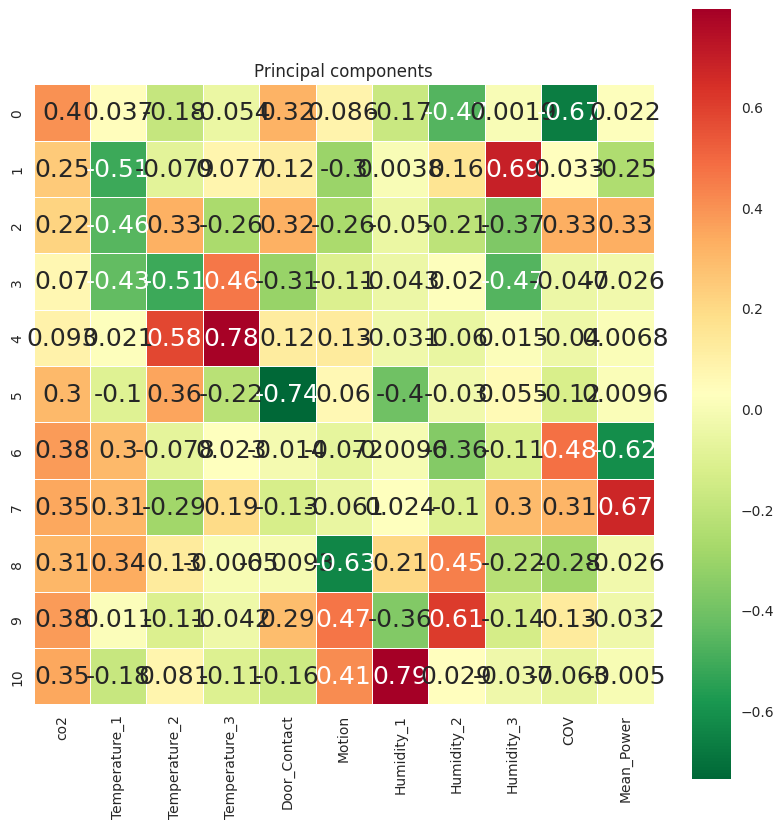

In [574]:
#heatmap
comps = pd.DataFrame(A,columns = ['co2', 'Temperature_1', 'Temperature_2', 'Temperature_3',
       'Door_Contact', 'Motion', 'Humidity_1', 'Humidity_2', 'Humidity_3',
       'COV', 'Mean_Power'])
plt.figure(figsize=(10, 10))
sns.heatmap(comps,cmap='RdYlGn_r', linewidths=0.5, annot=True,
            cbar=True, square=True)
ax.tick_params(labelbottom=False,labeltop=True)
plt.title('\n\nPrincipal components')

In [575]:
#Find out the number of components that covers 95% of explained variance
#In this case it is 2
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)
out['PC']

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [11] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [2] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [11] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[2]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


,PC1,PC2
0,-42.330385,3.063769
1,-42.113421,2.955436
2,-42.151116,3.169113
3,-42.151116,3.169113
4,-42.052801,3.260805
...,...,...
1063,42.840181,-48.284293
1064,86.109069,14.752672
1065,67.380195,11.948546
1066,74.892914,1.659115


[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '2 Principal Components explain [97.55%] of the variance'}, xlabel='PC1 (81.2% expl.var)', ylabel='PC2 (14.5% expl.var)'>)

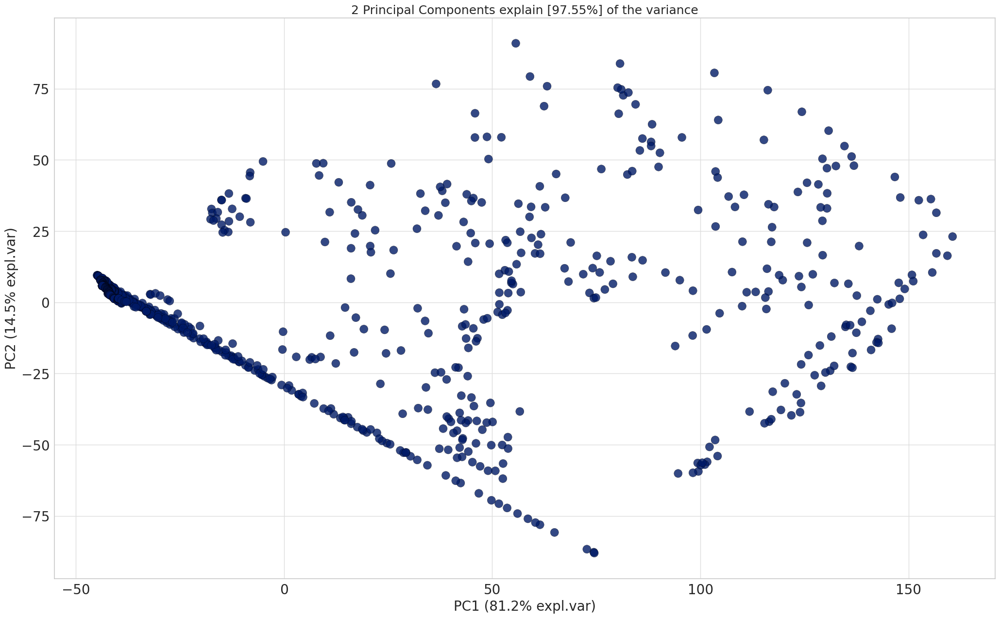

In [576]:
model.scatter(label=True, legend=False)

In [577]:
#EigenVectors
A = out['loadings'].T
A

,PC1,PC2
co2,0.736546,-0.593946
Temperature_1,0.041552,0.027507
Temperature_2,0.056763,0.064185
Temperature_3,0.015456,0.021334
Door_Contact,0.000484,0.000304
Motion,0.004782,0.003819
Humidity_1,0.040556,-0.040406
Humidity_2,0.120555,-0.143318
Humidity_3,0.067287,-0.081129
COV,0.221746,-0.104514


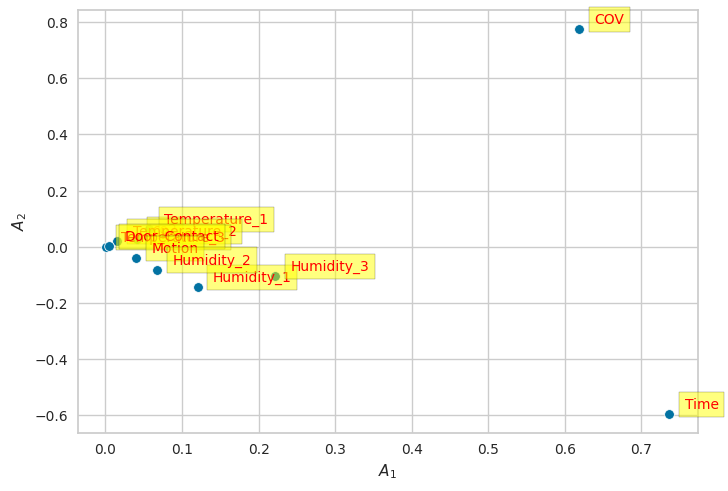

In [578]:
#Scatterplot
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))


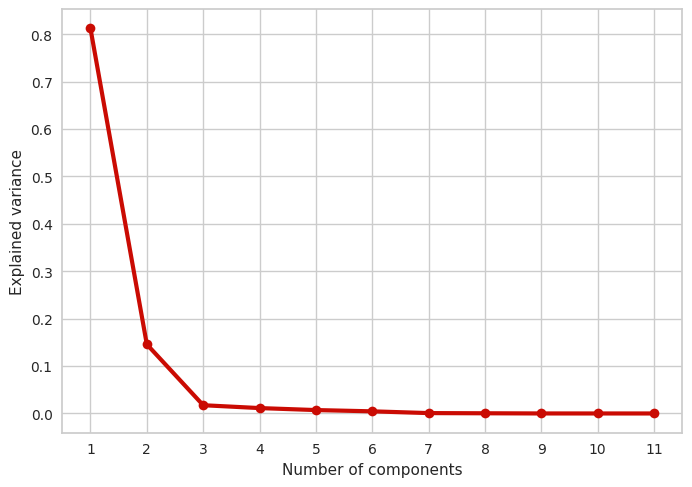

In [579]:
#Screeplot

VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

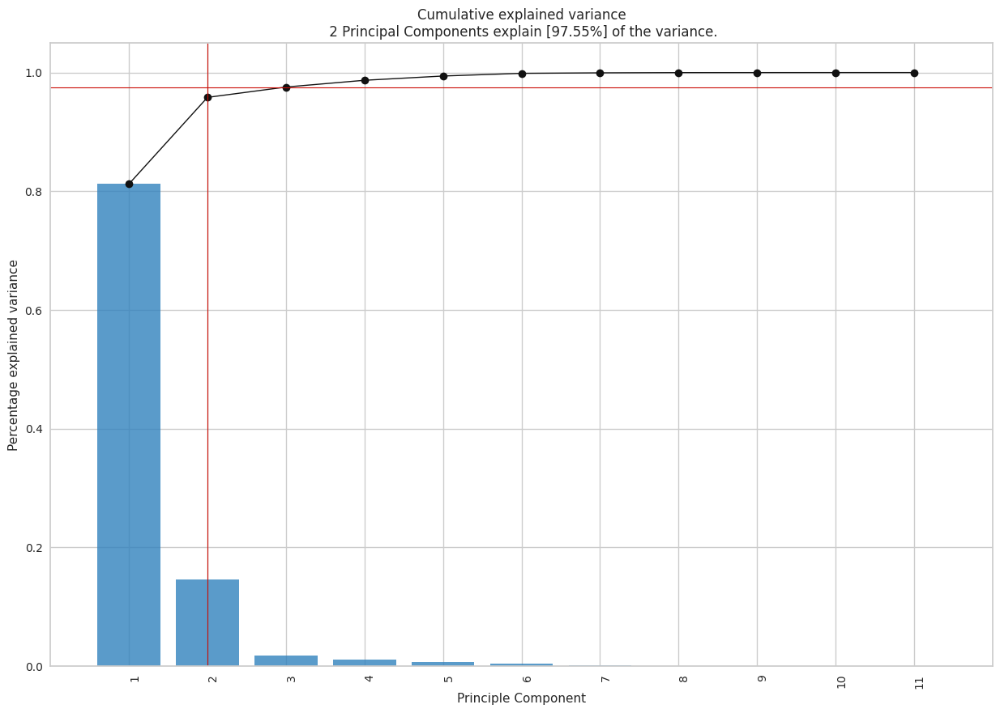

In [580]:
#Explained Variance Plot
model.plot();

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '2 Principal Components explain [97.55%] of the variance'}, xlabel='PC1 (81.2% expl.var)', ylabel='PC2 (14.5% expl.var)'>)

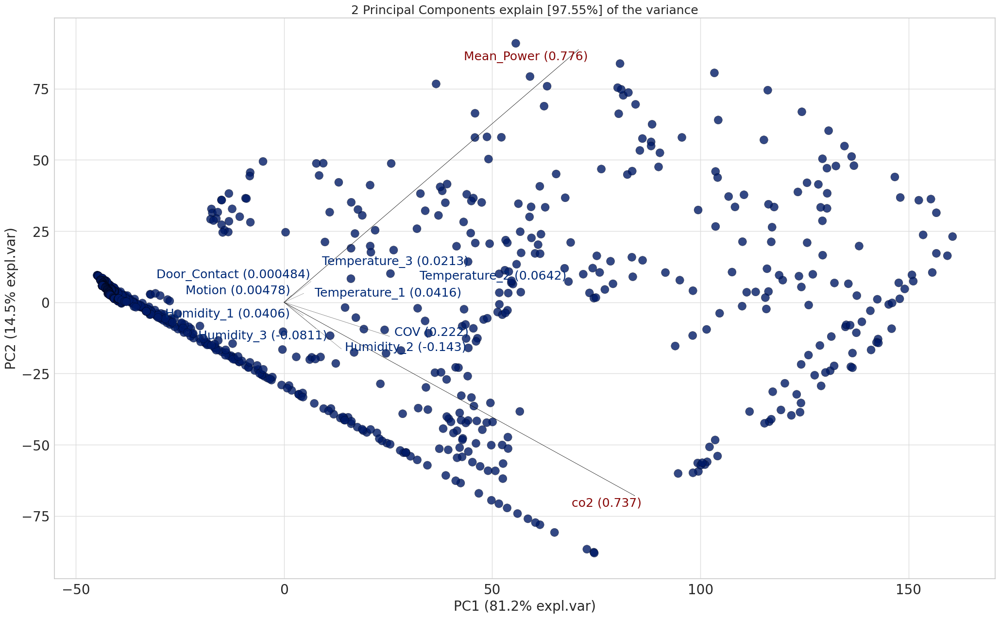

In [581]:
#Biplot
model.biplot(label=False, legend=False, color_arrow='k')

### Pycaret for Model Selection

### Pycaret

In [582]:
import pycaret
from pycaret.classification import *

In [583]:
from pycaret.utils import version
version()

'3.3.1'

In [584]:
#X_train, X_test, y_train, y_test = train_test_split(X,df['Presence'], test_size=0.25, stratify=df['Presence'], random_state = 42)
data_train = df1.sample(frac=0.75, random_state=42)
data_test = df1.drop(data_train.index)

In [585]:
data_train.reset_index(drop=True, inplace=True)
data_test.reset_index(drop=True, inplace=True)

print('Data for Training: ' + str(data_train.shape))
print('Data For Testing: ' + str(data_test.shape))

Data for Training: (801, 12)
Data For Testing: (267, 12)


In [586]:
from pycaret.classification import *
clf = setup(data=df1, target='Presence', train_size=0.75,session_id=123)


,Description,Value
0,Session id,123
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(1068, 12)"
5,Transformed train set shape,"(801, 12)"
6,Transformed test set shape,"(267, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [587]:
from pycaret.classification import ClassificationExperiment
exp = ClassificationExperiment()
# check the type of exp
type(exp)
# init setup on exp
exp.setup(df1, target = 'Presence', train_size=0.75,session_id = 123)
remove_metric('AUC')
remove_metric('Kappa')
remove_metric('MCC')

,Description,Value
0,Session id,123
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(1068, 12)"
5,Transformed train set shape,"(801, 12)"
6,Transformed test set shape,"(267, 12)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [588]:
# compare baseline models
best = compare_models()

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
et,Extra Trees Classifier,0.9476,0.9476,0.9508,0.9475,0.1610
rf,Random Forest Classifier,0.9438,0.9438,0.9460,0.9437,0.2530
gbc,Gradient Boosting Classifier,0.9426,0.9426,0.9465,0.9429,0.6860
xgboost,Extreme Gradient Boosting,0.9401,0.9401,0.9433,0.9398,0.1370
lightgbm,Light Gradient Boosting Machine,0.9388,0.9388,0.9409,0.9386,0.8180
dt,Decision Tree Classifier,0.9276,0.9276,0.9330,0.9265,0.0270
qda,Quadratic Discriminant Analysis,0.9002,0.9002,0.9092,0.9020,0.0260
lda,Linear Discriminant Analysis,0.8965,0.8965,0.8984,0.8953,0.0260
lr,Logistic Regression,0.8839,0.8839,0.8838,0.8809,0.8400
nb,Naive Bayes,0.8815,0.8815,0.8935,0.8847,0.0280


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [589]:
best

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

## Create Random Forest Model

In [590]:
rf = create_model('rf')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9295,0.9260
1,0.9625,0.9625,0.9618,0.9619
2,0.9625,0.9625,0.9618,0.9619
3,0.9250,0.9250,0.9247,0.9241
4,0.9375,0.9375,0.9346,0.9353
5,0.9625,0.9625,0.9691,0.9600
6,0.9125,0.9125,0.9263,0.9169
7,0.9500,0.9500,0.9500,0.9500
8,0.9375,0.9375,0.9404,0.9386


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [591]:
tuned_rf=tune_model(rf)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9012,0.9012,0.9126,0.9056
1,0.9125,0.9125,0.9138,0.9127
2,0.9500,0.9500,0.9529,0.9495
3,0.9375,0.9375,0.9375,0.9375
4,0.9375,0.9375,0.9382,0.9373
5,0.9250,0.9250,0.9475,0.9268
6,0.9000,0.9000,0.9153,0.9052
7,0.9250,0.9250,0.9361,0.9275
8,0.9125,0.9125,0.9216,0.9153


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [592]:
tuned_rf

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [593]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Extra Trees Classifier Model

In [594]:
et = create_model('et')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9506,0.9506,0.9517,0.9500
1,0.9625,0.9625,0.9644,0.9614
2,0.9750,0.9750,0.9752,0.9746
3,0.9375,0.9375,0.9381,0.9374
4,0.9625,0.9625,0.9618,0.9619
5,0.9625,0.9625,0.9691,0.9600
6,0.8875,0.8875,0.8985,0.8914
7,0.9500,0.9500,0.9564,0.9513
8,0.9250,0.9250,0.9279,0.9261


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [595]:
tuned_et=tune_model(et)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8889,0.8889,0.8925,0.8905
1,0.9250,0.9250,0.9250,0.9250
2,0.9500,0.9500,0.9500,0.9500
3,0.9375,0.9375,0.9381,0.9374
4,0.9375,0.9375,0.9377,0.9351
5,0.9375,0.9375,0.9463,0.9362
6,0.9000,0.9000,0.9167,0.9054
7,0.9375,0.9375,0.9408,0.9361
8,0.9125,0.9125,0.9225,0.9141


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [596]:
tuned_et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

In [597]:
evaluate_model(tuned_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Create Gradient Boosting Classifier

In [598]:
gbc = create_model('gbc')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9259,0.9259,0.9295,0.9260
1,0.9625,0.9625,0.9618,0.9619
2,0.9750,0.9750,0.9766,0.9745
3,0.9125,0.9125,0.9133,0.9125
4,0.9500,0.9500,0.9488,0.9483
5,0.9500,0.9500,0.9611,0.9487
6,0.9000,0.9000,0.9099,0.9036
7,0.9500,0.9500,0.9531,0.9512
8,0.9250,0.9250,0.9304,0.9269


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [599]:
tuned_gbc=tune_model(gbc)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9012,0.9012,0.9012,0.9012
1,0.9375,0.9375,0.9346,0.9353
2,0.9750,0.9750,0.9752,0.9746
3,0.9250,0.9250,0.9247,0.9241
4,0.9375,0.9375,0.9346,0.9353
5,0.9500,0.9500,0.9549,0.9474
6,0.9000,0.9000,0.9052,0.9020
7,0.9625,0.9625,0.9618,0.9619
8,0.9500,0.9500,0.9500,0.9500


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [600]:
tuned_gbc

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [601]:
evaluate_model(tuned_gbc)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

## Find best model using PCA

In [602]:
clf_pca = setup(data=df1, target='Presence',train_size=0.75,normalize = True, session_id=125, pca = True, pca_components = 2, pca_method='incremental')
remove_metric('AUC')
remove_metric('Kappa')
remove_metric('MCC')

,Description,Value
0,Session id,125
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(1068, 3)"
5,Transformed train set shape,"(801, 3)"
6,Transformed test set shape,"(267, 3)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [603]:
best_pca = compare_models()

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
et,Extra Trees Classifier,0.8989,0.8989,0.9073,0.8977,0.2270
rf,Random Forest Classifier,0.8964,0.8964,0.9015,0.8947,0.2180
knn,K Neighbors Classifier,0.8939,0.8939,0.8990,0.8915,0.0490
lightgbm,Light Gradient Boosting Machine,0.8914,0.8914,0.8967,0.8904,1.2660
xgboost,Extreme Gradient Boosting,0.8901,0.8901,0.8962,0.8904,0.1200
gbc,Gradient Boosting Classifier,0.8839,0.8839,0.8890,0.8840,0.4290
dt,Decision Tree Classifier,0.8714,0.8714,0.8787,0.8720,0.0750
qda,Quadratic Discriminant Analysis,0.8689,0.8689,0.8761,0.8696,0.0430
lda,Linear Discriminant Analysis,0.8689,0.8689,0.8761,0.8696,0.0400
nb,Naive Bayes,0.8615,0.8615,0.8613,0.8595,0.0390


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

### Classification Models with PCA and TOMEKLINKS for imbalanced data

In [632]:
from imblearn.under_sampling import TomekLinks
tl = TomekLinks()
clf_pca = setup(data=df1, target='Presence',train_size=0.75,normalize = True, session_id=125, pca = True, pca_components = 2, fix_imbalance=True,fix_imbalance_method= tl, pca_method='incremental')
remove_metric('AUC')
remove_metric('Kappa')
remove_metric('MCC')

,Description,Value
0,Session id,125
1,Target,Presence
2,Target type,Multiclass
3,Original data shape,"(1068, 12)"
4,Transformed data shape,"(1017, 3)"
5,Transformed train set shape,"(750, 3)"
6,Transformed test set shape,"(267, 3)"
7,Numeric features,11
8,Preprocess,True
9,Imputation type,simple


In [633]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
et,Extra Trees Classifier,0.9064,0.9064,0.9100,0.9056,0.2630
rf,Random Forest Classifier,0.8989,0.8989,0.9046,0.8979,0.2240
lightgbm,Light Gradient Boosting Machine,0.8939,0.8939,0.8983,0.8930,1.8710
xgboost,Extreme Gradient Boosting,0.8902,0.8902,0.8920,0.8894,0.1290
knn,K Neighbors Classifier,0.8889,0.8889,0.8917,0.8877,0.0640
gbc,Gradient Boosting Classifier,0.8876,0.8876,0.8917,0.8877,0.4400
dt,Decision Tree Classifier,0.8763,0.8763,0.8780,0.8743,0.0520
qda,Quadratic Discriminant Analysis,0.8752,0.8752,0.8829,0.8768,0.0560
lda,Linear Discriminant Analysis,0.8702,0.8702,0.8786,0.8709,0.0530
nb,Naive Bayes,0.8677,0.8677,0.8716,0.8676,0.0520


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [634]:
compare_tree_models_results = pull()
compare_tree_models_results

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
et,Extra Trees Classifier,0.9064,0.9064,0.9100,0.9056,0.263
rf,Random Forest Classifier,0.8989,0.8989,0.9046,0.8979,0.224
lightgbm,Light Gradient Boosting Machine,0.8939,0.8939,0.8983,0.8930,1.871
xgboost,Extreme Gradient Boosting,0.8902,0.8902,0.8920,0.8894,0.129
knn,K Neighbors Classifier,0.8889,0.8889,0.8917,0.8877,0.064
gbc,Gradient Boosting Classifier,0.8876,0.8876,0.8917,0.8877,0.440
dt,Decision Tree Classifier,0.8763,0.8763,0.8780,0.8743,0.052
qda,Quadratic Discriminant Analysis,0.8752,0.8752,0.8829,0.8768,0.056
lda,Linear Discriminant Analysis,0.8702,0.8702,0.8786,0.8709,0.053
nb,Naive Bayes,0.8677,0.8677,0.8716,0.8676,0.052


In [635]:
best_f1_models_top3 = compare_models(sort = 'F1', n_select = 3)

,Model,Accuracy,Recall,Prec.,F1,TT (Sec)
et,Extra Trees Classifier,0.9064,0.9064,0.9100,0.9056,0.2270
rf,Random Forest Classifier,0.8989,0.8989,0.9046,0.8979,0.2250
lightgbm,Light Gradient Boosting Machine,0.8939,0.8939,0.8983,0.8930,0.7740
xgboost,Extreme Gradient Boosting,0.8902,0.8902,0.8920,0.8894,0.1300
knn,K Neighbors Classifier,0.8889,0.8889,0.8917,0.8877,0.0630
gbc,Gradient Boosting Classifier,0.8876,0.8876,0.8917,0.8877,0.4320
qda,Quadratic Discriminant Analysis,0.8752,0.8752,0.8829,0.8768,0.0730
dt,Decision Tree Classifier,0.8763,0.8763,0.8780,0.8743,0.0870
lda,Linear Discriminant Analysis,0.8702,0.8702,0.8786,0.8709,0.0640
nb,Naive Bayes,0.8677,0.8677,0.8716,0.8676,0.0540


Processing:   0%|          | 0/67 [00:00<?, ?it/s]

In [636]:
best_f1_models_top3

[ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                      criterion='gini', max_depth=None, max_features='sqrt',
                      max_leaf_nodes=None, max_samples=None,
                      min_impurity_decrease=0.0, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      monotonic_cst=None, n_estimators=100, n_jobs=-1,
                      oob_score=False, random_state=125, verbose=0,
                      warm_start=False),
 RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                        criterion='gini', max_depth=None, max_features='sqrt',
                        max_leaf_nodes=None, max_samples=None,
                        min_impurity_decrease=0.0, min_samples_leaf=1,
                        min_samples_split=2, min_weight_fraction_leaf=0.0,
                        monotonic_cst=None, n_estimators=100, n_jobs=-1,
                        oob_scor

In [637]:
#This function trains a Soft Voting / Majority Rule classifier for select models passed in the estimator_list parameter.
blend_models(best_f1_models_top3)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9012,0.9012,0.9048,0.9021
1,0.8625,0.8625,0.8630,0.8609
2,0.9250,0.9250,0.9262,0.9232
3,0.8750,0.8750,0.8760,0.8738
4,0.9500,0.9500,0.9518,0.9504
5,0.9500,0.9500,0.9529,0.9504
6,0.8750,0.8750,0.8843,0.8791
7,0.8875,0.8875,0.9072,0.8790
8,0.9375,0.9375,0.9508,0.9387


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

VotingClassifier(estimators=[('Extra Trees Classifier',
                              ExtraTreesClassifier(bootstrap=False,
                                                   ccp_alpha=0.0,
                                                   class_weight=None,
                                                   criterion='gini',
                                                   max_depth=None,
                                                   max_features='sqrt',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   monotonic_cst=None,
                                                   n_estimators=100, n_jobs=-1...
                                             importance_type='split',
                                             learning_rate=0.1, max_depth=-1,
                                             min_child_samples=20,
                                             min_child_weight=0.001,
                                             min_split_gain=0.0,
                                             n_estimators=100, n_jobs=-1,
                                             num_leaves=31, objective=None,
                                             random_state=125, reg_alpha=0.0,
                                             reg_lambda=0.0, subsample=1.0,
                                             subsample_for_bin=200000,
                                             subsample_freq=0))],
                 flatten_transform=True, n_jobs=-1, verbose=False,
                 voting='soft', weights=None)

In [638]:
#Tune best Model
best_model_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=125, verbose=0,
                     warm_start=False)

In [639]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8272,0.8272,0.8596,0.8382
1,0.9000,0.9000,0.9069,0.9027
2,0.8750,0.8750,0.8748,0.8722
3,0.8750,0.8750,0.8879,0.8802
4,0.9125,0.9125,0.9290,0.9166
5,0.8375,0.8375,0.8662,0.8486
6,0.8375,0.8375,0.8620,0.8474
7,0.8625,0.8625,0.8721,0.8657
8,0.9000,0.9000,0.9200,0.9051


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [640]:
tuned_best_model_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=125, verbose=0,
                     warm_start=False)

In [641]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [642]:
#creating et Model

In [643]:
et_pca = create_model('et')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8889,0.8889,0.8973,0.8914
1,0.8875,0.8875,0.8918,0.8884
2,0.9250,0.9250,0.9352,0.9223
3,0.8625,0.8625,0.8578,0.8599
4,0.9375,0.9375,0.9386,0.9368
5,0.9375,0.9375,0.9422,0.9369
6,0.8875,0.8875,0.8928,0.8899
7,0.8625,0.8625,0.8617,0.8555
8,0.9500,0.9500,0.9581,0.9510


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [644]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8272,0.8272,0.8596,0.8382
1,0.9000,0.9000,0.9069,0.9027
2,0.8750,0.8750,0.8748,0.8722
3,0.8750,0.8750,0.8879,0.8802
4,0.9125,0.9125,0.9290,0.9166
5,0.8375,0.8375,0.8662,0.8486
6,0.8375,0.8375,0.8620,0.8474
7,0.8625,0.8625,0.8721,0.8657
8,0.9000,0.9000,0.9200,0.9051


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [645]:
tuned_et_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=125, verbose=0,
                     warm_start=False)

In [646]:
evaluate_model(tuned_et_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [647]:
#Creating rf model with PCA
rf_pca = create_model('rf')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.9012,0.9012,0.9048,0.9021
1,0.8750,0.8750,0.8847,0.8742
2,0.9125,0.9125,0.9175,0.9103
3,0.8500,0.8500,0.8433,0.8453
4,0.9500,0.9500,0.9536,0.9491
5,0.9375,0.9375,0.9422,0.9369
6,0.8375,0.8375,0.8568,0.8460
7,0.8750,0.8750,0.8823,0.8674
8,0.9250,0.9250,0.9367,0.9238


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [648]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8642,0.8642,0.8853,0.8709
1,0.8875,0.8875,0.8835,0.8848
2,0.9000,0.9000,0.9045,0.8952
3,0.8875,0.8875,0.8881,0.8861
4,0.9375,0.9375,0.9398,0.9384
5,0.8250,0.8250,0.8342,0.8289
6,0.8250,0.8250,0.8487,0.8348
7,0.9000,0.9000,0.8984,0.8888
8,0.9125,0.9125,0.9226,0.9081


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [649]:
tuned_rf_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=125, verbose=0,
                       warm_start=False)

In [650]:
evaluate_model(tuned_rf_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [651]:
#Creating lightgbm model with PCA
lightgbm_pca = create_model('lightgbm')

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8889,0.8889,0.8892,0.8886
1,0.8625,0.8625,0.8693,0.8605
2,0.9250,0.9250,0.9306,0.9248
3,0.8625,0.8625,0.8692,0.8635
4,0.9250,0.9250,0.9250,0.9250
5,0.9000,0.9000,0.8969,0.8981
6,0.8500,0.8500,0.8597,0.8543
7,0.8750,0.8750,0.8823,0.8674
8,0.9250,0.9250,0.9345,0.9270


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [652]:
tuned_lightgbm_pca = tune_model(lightgbm_pca)

,Accuracy,Recall,Prec.,F1
Fold,,,,
0,0.8395,0.8395,0.8440,0.8416
1,0.8500,0.8500,0.8420,0.8446
2,0.8875,0.8875,0.8872,0.8806
3,0.8750,0.8750,0.8701,0.8704
4,0.9375,0.9375,0.9407,0.9342
5,0.8000,0.8000,0.8104,0.8031
6,0.8375,0.8375,0.8347,0.8353
7,0.9000,0.9000,0.9025,0.8912
8,0.8875,0.8875,0.8930,0.8877


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [653]:
tuned_lightgbm_pca

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=125, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [654]:
evaluate_model(tuned_lightgbm_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

### Save Best Model PCA

In [655]:
save_model(tuned_best_model_pca, 'best_pca')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['co2', 'Temperature_1',
                                              'Temperature_2', 'Temperature_3',
                                              'Door_Contact', 'Motion',
                                              'Humidity_1', 'Humidity_2',
                                              'Humidity_3', 'COV',
                                              'Mean_Power'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missing_...
                  ExtraTreesClassifier(boot

### Explainable AI using SHAP values

In [656]:
import shap

In [657]:
from sklearn.ensemble import ExtraTreesClassifier
model_cat = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=125, verbose=0,
                     warm_start=False)


In [658]:
#Apply tomek Links to fix imbalance data
X_res, y_res = tl.fit_resample(X, df['Presence'])
pca = PCA(n_components=2)
# Fit PCA to the data and transform it
X_pca = pca.fit_transform(X_res)
X_pca = pd.DataFrame(X_pca)
X_pca.columns=['Component_1', 'Component_2']
model_cat.fit(X_pca,y_res)

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=125, verbose=0,
                     warm_start=False)

In [659]:
model_cat.predict_proba(X_pca)[0]

array([1., 0., 0.])

In [660]:
explainer = shap.Explainer(model_cat)
shap_values_cat=explainer(X_pca)
print(np.shape(shap_values_cat))

(1047, 2, 3)


Because we are doing multiclass classification, we cannot use SHAP built-in functions directly. We find an alternative by plotting shap plots individual class.

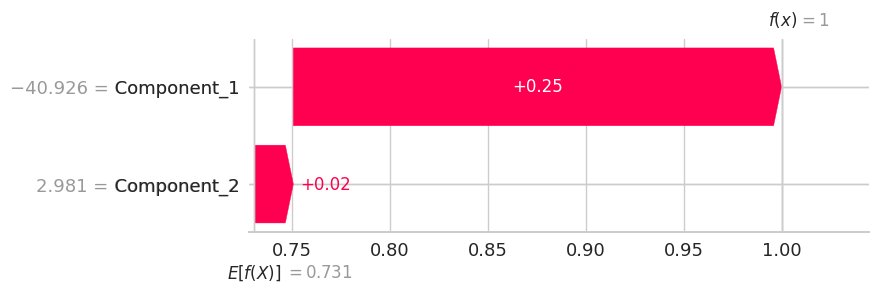

In [661]:
shap.plots.waterfall(shap_values_cat[0,:,0])

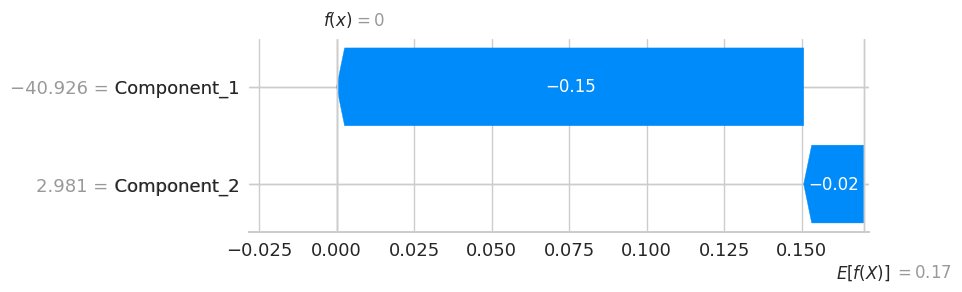

In [662]:
shap.plots.waterfall(shap_values_cat[0,:,1])

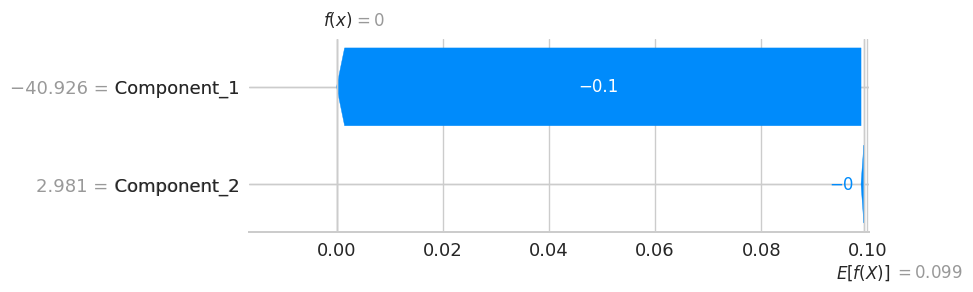

In [663]:
shap.plots.waterfall(shap_values_cat[0,:,2])

Alternatively, we can try to plot the means of the shapvalues for each class

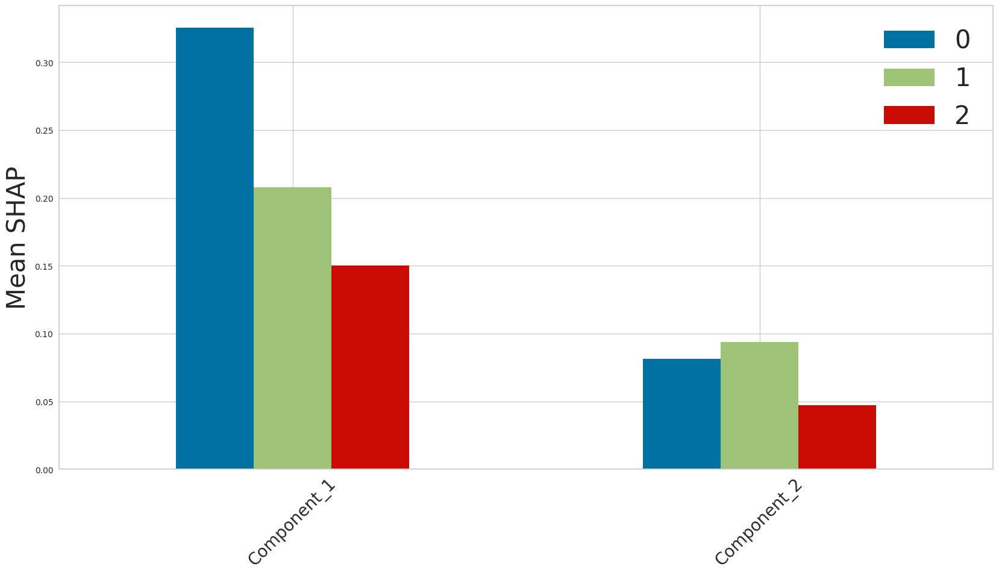

In [664]:
mean_0 = np.mean(np.abs(shap_values_cat.values[:,:,0]), axis=0)
mean_1 = np.mean(np.abs(shap_values_cat.values[:,:,1]), axis=0)
mean_2 = np.mean(np.abs(shap_values_cat.values[:,:,2]), axis=0)
dframe= pd.DataFrame({'0': mean_0, '1':mean_1, '2':mean_2})

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
dframe.plot.bar(ax=ax)

ax.set_ylabel("Mean SHAP", size=30)
ax.set_xticklabels(X_pca.columns,rotation=45, size=20)
ax.legend(fontsize=30)

However, the above method can get a bit messy. An alternative way is to aggregate the plots together as follows

In [665]:
preds = model_cat.predict(X_pca)
new_shap_values=[]
for i, pred in enumerate(preds):
  new_shap_values.append(shap_values_cat.values[i][:,pred])

shap_values_cat.values = np.array(new_shap_values)
print(shap_values_cat.shape)

(1047, 2)


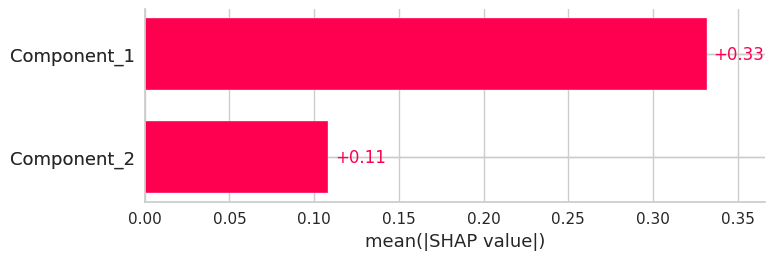

In [666]:
shap.plots.bar(shap_values_cat)

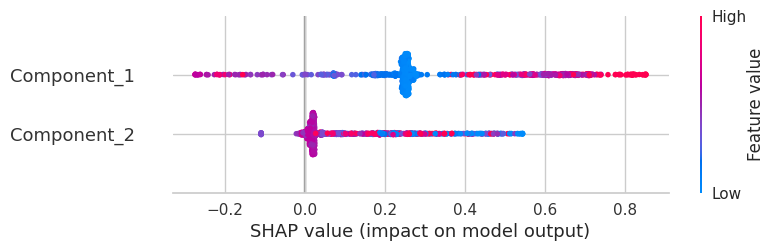

In [667]:
shap.plots.beeswarm(shap_values_cat)

In [668]:
shap.initjs()
shap.plots.force(shap_values_cat[...,0])

In [669]:
shap.initjs()
shap.plots.force(shap_values_cat[...,1])

In [670]:
shap.initjs()
shap_values = explainer.shap_values(X_pca)
shap.force_plot(explainer.expected_value[0], shap_values[..., 0], X_pca)

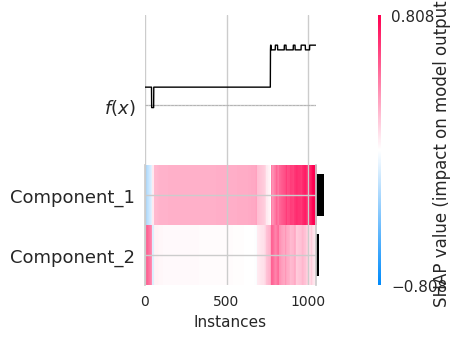

In [671]:
shap.plots.heatmap(shap_values_cat[:1068])

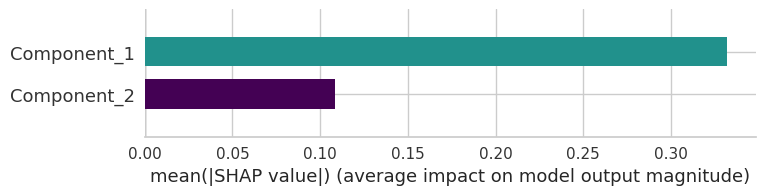

In [672]:
class_names =  ['0','1','2']
colors = plt.cm.viridis(np.linspace(0, 1, len(class_names)))
shap.summary_plot(shap_values_cat, X_pca.values, plot_type="bar", class_names= ['0','1','2'], feature_names = X_pca.columns, color=colors)

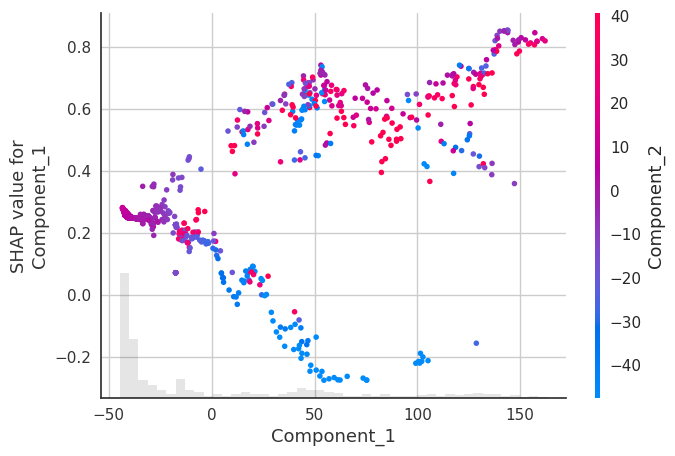

In [673]:
#Components are randomly distributed showing that there is no correlationship between PCA components
shap.plots.scatter(shap_values_cat[:,"Component_1"],color=shap_values_cat[:,"Component_2"])